Step 1 - Downloading the Data

In [1]:
!pip install numpy pandas-profiling matplotlib seaborn --quiet

In [2]:
!pip install opendatasets scikit-learn plotly folium --upgrade --quiet

In [3]:
import os
import opendatasets as od
import pandas as pd
import numpy as np
pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)

In [4]:
od.download('https://www.kaggle.com/c/DontGetKicked')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: prithivimoktan
Your Kaggle Key: ········


100%|██████████| 10.2M/10.2M [00:00<00:00, 52.9MB/s]



Extracting archive ./DontGetKicked/DontGetKicked.zip to ./DontGetKicked


In [5]:
os.listdir('DontGetKicked')

['test.csv',
 'test.zip',
 'training.csv',
 'example_entry.csv',
 'training.zip',
 'Carvana_Data_Dictionary.txt']

In [6]:
train_df = pd.read_csv('./DontGetKicked/training.csv')

In [7]:
train_df.head(10)

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,RED,AUTO,1.0,Alloy,89046,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,WHITE,AUTO,1.0,Alloy,93593,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,MAROON,AUTO,2.0,Covers,73807,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,SILVER,AUTO,1.0,Alloy,65617,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,SILVER,MANUAL,2.0,Covers,69367,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020
5,6,0,12/7/2009,ADESA,2004,5,MITSUBISHI,GALANT 4C,ES,4D SEDAN ES,WHITE,AUTO,2.0,Covers,81054,OTHER ASIAN,MEDIUM,OTHER,3901.0,4908.0,6706.0,8577.0,4709.0,5827.0,8149.0,9451.0,NaN,NaN,19638,33619,FL,5600.0,0,594
6,7,0,12/7/2009,ADESA,2004,5,KIA,SPECTRA,EX,4D SEDAN EX,BLACK,AUTO,2.0,Covers,65328,OTHER ASIAN,MEDIUM,OTHER,2966.0,4038.0,6240.0,8496.0,2980.0,4115.0,6230.0,8603.0,NaN,NaN,19638,33619,FL,4200.0,0,533
7,8,0,12/7/2009,ADESA,2005,4,FORD,TAURUS,SE,4D SEDAN SE,WHITE,AUTO,2.0,Covers,65805,AMERICAN,MEDIUM,FORD,3313.0,4342.0,6667.0,7707.0,3713.0,4578.0,6942.0,8242.0,NaN,NaN,19638,33619,FL,4500.0,0,825
8,9,0,12/7/2009,ADESA,2007,2,KIA,SPECTRA,EX,4D SEDAN EX,BLACK,AUTO,2.0,Covers,49921,OTHER ASIAN,MEDIUM,OTHER,6196.0,7274.0,9687.0,10624.0,6417.0,7371.0,9637.0,10778.0,NaN,NaN,21973,33619,FL,5600.0,0,482
9,10,0,12/7/2009,ADESA,2007,2,FORD,FIVE HUNDRED,SEL,4D SEDAN SEL,RED,AUTO,1.0,Alloy,84872,AMERICAN,LARGE,FORD,7845.0,9752.0,11734.0,13656.0,9167.0,10988.0,12580.0,14845.0,NaN,NaN,21973,33619,FL,7700.0,0,1633


In [8]:
test_df = pd.read_csv('./DontGetKicked/test.csv')

In [9]:
test_df.head(10)

,RefId,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,73015,12/2/2009,ADESA,2005,4,PONTIAC,GRAND PRIX,Bas,4D SEDAN,SILVER,AUTO,1.0,Alloy,85377,AMERICAN,LARGE,GM,5032.0,6386.0,5935.0,7397.0,4905.0,6181.0,8557.0,9752.0,NaN,NaN,18881,30212,GA,6500.0,0,2152
1,73016,12/2/2009,ADESA,2005,4,CHEVROLET,MALIBU V6,LS,4D SEDAN LS,SILVER,AUTO,1.0,Alloy,61873,AMERICAN,MEDIUM,GM,4502.0,5685.0,5362.0,6640.0,4645.0,5710.0,7562.0,9296.0,NaN,NaN,18111,30212,GA,6300.0,0,1118
2,73017,12/2/2009,ADESA,2006,3,DODGE,DURANGO 2WD V8,Adv,4D SUV 4.7L ADVENTURER,SILVER,AUTO,1.0,Alloy,69283,AMERICAN,MEDIUM SUV,CHRYSLER,10244.0,13041.0,11564.0,14584.0,10883.0,12166.0,15340.0,16512.0,NaN,NaN,18111,30212,GA,9700.0,0,1215
3,73018,12/2/2009,ADESA,2002,7,SATURN,L SERIES,L20,4D SEDAN L200,GOLD,AUTO,1.0,Alloy,87889,AMERICAN,MEDIUM,GM,2558.0,3542.0,3263.0,4325.0,2928.0,3607.0,5725.0,6398.0,NaN,NaN,18881,30212,GA,4150.0,0,1933
4,73019,12/2/2009,ADESA,2007,2,HYUNDAI,ACCENT,GS,2D COUPE GS,BLUE,AUTO,NaN,NaN,73432,OTHER ASIAN,COMPACT,OTHER,5013.0,6343.0,5914.0,7350.0,5013.0,6343.0,5914.0,7350.0,NaN,NaN,18111,30212,GA,4100.0,0,920
5,73020,12/2/2009,ADESA,2006,3,DODGE,STRATUS 4C,SXT,4D SEDAN,GREEN,AUTO,1.0,Alloy,91059,AMERICAN,MEDIUM,CHRYSLER,4350.0,5313.0,5198.0,6238.0,4161.0,5107.0,7118.0,8102.0,NaN,NaN,18881,30212,GA,4200.0,0,1341
6,73021,12/2/2009,ADESA,2006,3,FORD,EXPLORER 2WD V6,XLS,4D SUV 4.0L XLS,BROWN,AUTO,1.0,Alloy,71852,AMERICAN,MEDIUM SUV,FORD,8576.0,10460.0,9762.0,11797.0,8765.0,10431.0,13679.0,14650.0,NaN,NaN,18881,30212,GA,8500.0,0,1155
7,73022,12/2/2009,ADESA,2003,6,CHRYSLER,PT CRUISER,Tou,4D SEDAN LIMITED,BLUE,MANUAL,1.0,Alloy,74961,AMERICAN,MEDIUM,CHRYSLER,3900.0,4760.0,4712.0,5641.0,3792.0,4648.0,6912.0,7734.0,NaN,NaN,18881,30212,GA,4100.0,0,1689
8,73023,12/2/2009,ADESA,2005,4,CHEVROLET,MALIBU 4C,Bas,4D SEDAN,SILVER,AUTO,1.0,Alloy,43456,AMERICAN,MEDIUM,GM,4359.0,5325.0,5208.0,6251.0,4250.0,5426.0,7412.0,8507.0,NaN,NaN,18111,30212,GA,5900.0,0,764
9,73024,12/2/2009,ADESA,2006,3,CHRYSLER,TOWN & COUNTRY FWD V,Tou,MINIVAN 3.8L,WHITE,AUTO,NaN,NaN,78212,AMERICAN,VAN,CHRYSLER,8299.0,11182.0,9463.0,12577.0,9588.0,11839.0,13162.0,15506.0,NaN,NaN,18111,30212,GA,6700.0,0,1623


In [10]:
print(train_df.shape, test_df.shape)

(72983, 34) (48707, 33)


In [11]:
train_df.describe()

,RefId,IsBadBuy,VehYear,VehicleAge,WheelTypeID,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,BYRNO,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost
count,72983.000000,72983.000000,72983.000000,72983.000000,69814.000000,72983.000000,72965.000000,72965.000000,72965.000000,72965.000000,72668.000000,72668.000000,72668.000000,72668.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000
mean,36511.428497,0.122988,2005.343052,4.176644,1.494299,71499.995917,6128.909217,7373.636031,8497.034332,9850.928240,6132.081287,7390.681827,8775.723331,10145.385314,26345.842155,58043.059945,6730.934326,0.025280,1276.580985
std,21077.241302,0.328425,1.731252,1.712210,0.521290,14578.913128,2461.992768,2722.491986,3156.285284,3385.789541,2434.567723,2686.248852,3090.702941,3310.254351,25717.351219,26151.640415,1767.846435,0.156975,598.846788
min,1.000000,0.000000,2001.000000,0.000000,0.000000,4825.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,835.000000,2764.000000,1.000000,0.000000,462.000000
25%,18257.500000,0.000000,2004.000000,3.000000,1.000000,61837.000000,4273.000000,5406.000000,6280.000000,7493.000000,4275.000000,5414.000000,6536.000000,7784.000000,17212.000000,32124.000000,5435.000000,0.000000,837.000000
50%,36514.000000,0.000000,2005.000000,4.000000,1.000000,73361.000000,6097.000000,7303.000000,8444.000000,9789.000000,6062.000000,7313.000000,8729.000000,10103.000000,19662.000000,73108.000000,6700.000000,0.000000,1155.000000
75%,54764.500000,0.000000,2007.000000,5.000000,2.000000,82436.000000,7765.000000,9021.000000,10651.000000,12088.000000,7736.000000,9013.000000,10911.000000,12309.000000,22808.000000,80022.000000,7900.000000,0.000000,1623.000000
max,73014.000000,1.000000,2010.000000,9.000000,3.000000,115717.000000,35722.000000,36859.000000,39080.000000,41482.000000,35722.000000,36859.000000,39080.000000,41062.000000,99761.000000,99224.000000,45469.000000,1.000000,7498.000000


In [12]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72983 entries, 0 to 72982
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   RefId                              72983 non-null  int64  
 1   IsBadBuy                           72983 non-null  int64  
 2   PurchDate                          72983 non-null  object 
 3   Auction                            72983 non-null  object 
 4   VehYear                            72983 non-null  int64  
 5   VehicleAge                         72983 non-null  int64  
 6   Make                               72983 non-null  object 
 7   Model                              72983 non-null  object 
 8   Trim                               70623 non-null  object 
 9   SubModel                           72975 non-null  object 
 10  Color                              72975 non-null  object 
 11  Transmission                       72974 non-null  obj

#### The dataset includes more than 72983 rows and 34 columns in total. Date columns, numeric columns, and categorical columns are included in the dataset. Our goal is to construct a model that can estimate the value that will be found in the column labeled "IsBadBuy." 

It would appear that some of the columns are missing values for some of the transactions.

In [13]:
train_df.isna().sum()

RefId                                    0
IsBadBuy                                 0
PurchDate                                0
Auction                                  0
VehYear                                  0
VehicleAge                               0
Make                                     0
Model                                    0
Trim                                  2360
SubModel                                 8
Color                                    8
Transmission                             9
WheelTypeID                           3169
WheelType                             3174
VehOdo                                   0
Nationality                              5
Size                                     5
TopThreeAmericanName                     5
MMRAcquisitionAuctionAveragePrice       18
MMRAcquisitionAuctionCleanPrice         18
MMRAcquisitionRetailAveragePrice        18
MMRAcquisitonRetailCleanPrice           18
MMRCurrentAuctionAveragePrice          315
MMRCurrentA

### Step 2 - Exploratory Data Analysis and Visualization

In [14]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [15]:
Number_of_bad_buys = train_df.IsBadBuy.value_counts()
fig = px.bar(train_df, x=['Yes','No'],y = Number_of_bad_buys, title = 'Number of Good buys')
fig.show()

## Alot of Yes denoting good buy

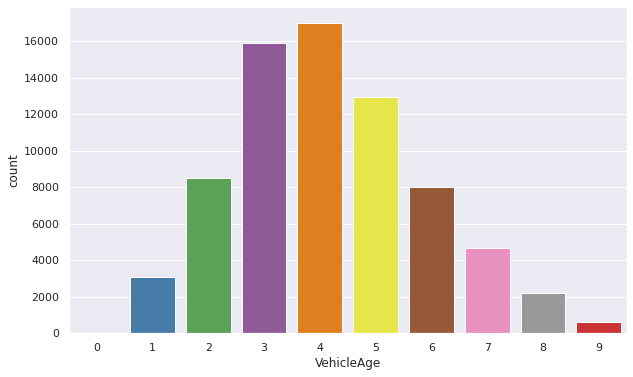

In [19]:
sns.set_theme(style="darkgrid")
age = pd.DataFrame(train_df.VehicleAge.value_counts())
ax = sns.countplot(x = "VehicleAge" , data=train_df, palette = "Set1")

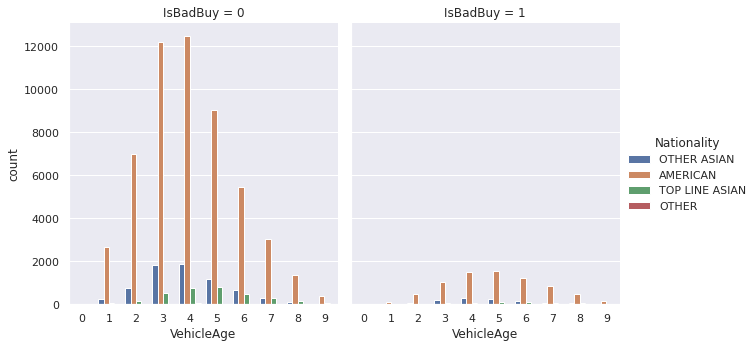

In [21]:
catplot_isbadbuy = sns.catplot(x="VehicleAge", hue = "Nationality", col="IsBadBuy",
                data=train_df, kind="count",
                height=5, aspect=.9);

In [22]:
px.histogram(train_df, x="VehicleAge", color="IsBadBuy", title="Bad Buy vs Vehicle Age")

In [23]:
px.pie(train_df, names="IsBadBuy", title="The total percentage of Good buys vs Bad buys")

In [24]:
px.histogram(train_df, x = "Make", color = "IsBadBuy")

In [25]:
px.histogram(train_df, x = "Nationality", color = "IsBadBuy")

In [26]:
px.histogram(train_df, x = "VehOdo", color = "IsBadBuy")

In [27]:
train_df.corr()

,RefId,IsBadBuy,VehYear,VehicleAge,WheelTypeID,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,BYRNO,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost
RefId,1.000000,0.023973,0.010580,-0.025404,0.013110,-0.026553,-0.011568,-0.015704,-0.032208,-0.034324,-0.008742,-0.013015,-0.021616,-0.024369,0.032896,0.131898,-0.011873,-0.048851,-0.023478
IsBadBuy,0.023973,1.000000,-0.158886,0.167164,-0.044620,0.082560,-0.109252,-0.102954,-0.087418,-0.083665,-0.109112,-0.104020,-0.103914,-0.100245,-0.061488,0.005796,-0.099911,-0.003697,0.052319
VehYear,0.010580,-0.158886,1.000000,-0.957957,0.259660,-0.283719,0.581146,0.532927,0.581191,0.539230,0.590820,0.548426,0.598490,0.558669,0.280791,0.068276,0.349965,0.057380,-0.268696
VehicleAge,-0.025404,0.167164,-0.957957,1.000000,-0.250801,0.319794,-0.565690,-0.518810,-0.460854,-0.426382,-0.575607,-0.532505,-0.504062,-0.469359,-0.268269,-0.074857,-0.312329,-0.024771,0.259310
WheelTypeID,0.013110,-0.044620,0.259660,-0.250801,1.000000,-0.213558,-0.095471,-0.129597,-0.072700,-0.102019,-0.088597,-0.121211,-0.074420,-0.102488,0.187199,0.007901,-0.162826,-0.006747,-0.132798
VehOdo,-0.026553,0.082560,-0.283719,0.319794,-0.213558,1.000000,-0.017022,0.024617,0.031306,0.063165,-0.028568,0.012107,0.015811,0.048005,-0.288456,-0.053041,-0.062008,0.029556,0.411718
MMRAcquisitionAuctionAveragePrice,-0.011568,-0.109252,0.581146,-0.565690,-0.095471,-0.017022,1.000000,0.990347,0.910391,0.910187,0.937817,0.932492,0.871755,0.871042,0.107734,0.045694,0.789840,0.038818,-0.050417
MMRAcquisitionAuctionCleanPrice,-0.015704,-0.102954,0.532927,-0.518810,-0.129597,0.024617,0.990347,1.000000,0.902718,0.918242,0.923610,0.932114,0.860716,0.871203,0.062502,0.040675,0.781516,0.038667,-0.020644
MMRAcquisitionRetailAveragePrice,-0.032208,-0.087418,0.581191,-0.460854,-0.072700,0.031306,0.910391,0.902718,1.000000,0.990201,0.851647,0.849407,0.913108,0.906054,0.107516,0.035489,0.746126,0.080627,-0.053444
MMRAcquisitonRetailCleanPrice,-0.034324,-0.083665,0.539230,-0.426382,-0.102019,0.063165,0.910187,0.918242,0.990201,1.000000,0.846914,0.855689,0.903188,0.906810,0.069676,0.031284,0.744966,0.077670,-0.026933


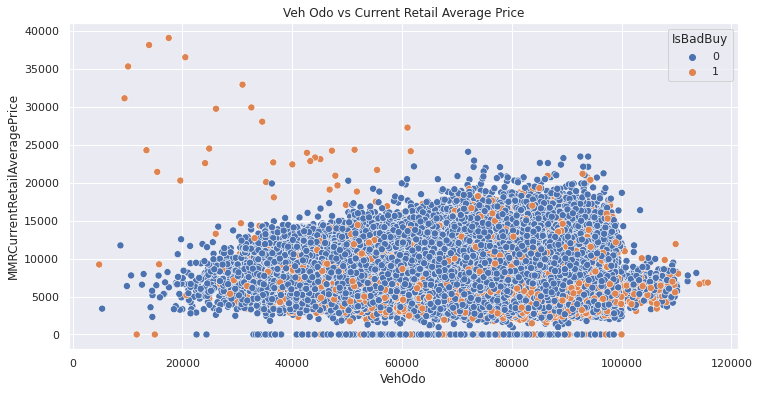

In [28]:
plt.figure(figsize=(12, 6))
plt.title('Veh Odo vs Current Retail Average Price')

sns.scatterplot(x=train_df.VehOdo, 
                y=train_df.MMRCurrentRetailAveragePrice, 
                hue=train_df.IsBadBuy,
                s=50);

Step 3 - Prepare the Dataset for Training

1. Identifying input and target columns

In [29]:
def split_date(df):
    df['Date'] = pd.to_datetime(df['PurchDate'])
    df['Year'] = df.Date.dt.year
    df['Month'] = df.Date.dt.month
    df['Day'] = df.Date.dt.day
    df['WeekOfYear'] = df.Date.dt.isocalendar().week

In [30]:
split_date(train_df)

In [31]:
train_df

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,Date,Year,Month,Day,WeekOfYear
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,RED,AUTO,1.0,Alloy,89046,OTHER ASIAN,MEDIUM,OTHER,8155.0,9829.0,11636.0,13600.0,7451.0,8552.0,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113,2009-12-07,2009,12,7,50
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,WHITE,AUTO,1.0,Alloy,93593,AMERICAN,LARGE TRUCK,CHRYSLER,6854.0,8383.0,10897.0,12572.0,7456.0,9222.0,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053,2009-12-07,2009,12,7,50
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,MAROON,AUTO,2.0,Covers,73807,AMERICAN,MEDIUM,CHRYSLER,3202.0,4760.0,6943.0,8457.0,4035.0,5557.0,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389,2009-12-07,2009,12,7,50
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,SILVER,AUTO,1.0,Alloy,65617,AMERICAN,COMPACT,CHRYSLER,1893.0,2675.0,4658.0,5690.0,1844.0,2646.0,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630,2009-12-07,2009,12,7,50
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,SILVER,MANUAL,2.0,Covers,69367,AMERICAN,COMPACT,FORD,3913.0,5054.0,7723.0,8707.0,3247.0,4384.0,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020,2009-12-07,2009,12,7,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72978,73010,1,12/2/2009,ADESA,2001,8,MERCURY,SABLE,GS,4D SEDAN GS,BLACK,AUTO,1.0,Alloy,45234,AMERICAN,MEDIUM,FORD,1996.0,2993.0,2656.0,3732.0,2190.0,3055.0,4836.0,5937.0,NaN,NaN,18111,30212,GA,4200.0,0,993,2009-12-02,2009,12,2,49
72979,73011,0,12/2/2009,ADESA,2007,2,CHEVROLET,MALIBU 4C,LS,4D SEDAN LS,SILVER,AUTO,NaN,NaN,71759,AMERICAN,MEDIUM,GM,6418.0,7325.0,7431.0,8411.0,6785.0,8132.0,10151.0,11652.0,NaN,NaN,18881,30212,GA,6200.0,0,1038,2009-12-02,2009,12,2,49
72980,73012,0,12/2/2009,ADESA,2005,4,JEEP,GRAND CHEROKEE 2WD V,Lar,4D WAGON LAREDO,SILVER,AUTO,1.0,Alloy,88500,AMERICAN,MEDIUM SUV,CHRYSLER,8545.0,9959.0,9729.0,11256.0,8375.0,9802.0,11831.0,14402.0,NaN,NaN,18111,30212,GA,8200.0,0,1893,2009-12-02,2009,12,2,49
72981,73013,0,12/2/2009,ADESA,2006,3,CHEVROLET,IMPALA,LS,4D SEDAN LS,WHITE,AUTO,1.0,Alloy,79554,AMERICAN,LARGE,GM,6420.0,7604.0,7434.0,8712.0,6590.0,7684.0,10099.0,11228.0,NaN,NaN,18881,30212,GA,7000.0,0,1974,2009-12-02,2009,12,2,49


In [32]:
train_df.columns

Index(['RefId', 'IsBadBuy', 'PurchDate', 'Auction', 'VehYear', 'VehicleAge',
       'Make', 'Model', 'Trim', 'SubModel', 'Color', 'Transmission',
       'WheelTypeID', 'WheelType', 'VehOdo', 'Nationality', 'Size',
       'TopThreeAmericanName', 'MMRAcquisitionAuctionAveragePrice',
       'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice',
       'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice',
       'MMRCurrentAuctionCleanPrice', 'MMRCurrentRetailAveragePrice',
       'MMRCurrentRetailCleanPrice', 'PRIMEUNIT', 'AUCGUART', 'BYRNO',
       'VNZIP1', 'VNST', 'VehBCost', 'IsOnlineSale', 'WarrantyCost', 'Date',
       'Year', 'Month', 'Day', 'WeekOfYear'],
      dtype='object')

In [33]:
train_df.nunique()

RefId                                72983
IsBadBuy                                 2
PurchDate                              517
Auction                                  3
VehYear                                 10
VehicleAge                              10
Make                                    33
Model                                 1063
Trim                                   134
SubModel                               863
Color                                   16
Transmission                             3
WheelTypeID                              4
WheelType                                3
VehOdo                               39947
Nationality                              4
Size                                    12
TopThreeAmericanName                     4
MMRAcquisitionAuctionAveragePrice    10342
MMRAcquisitionAuctionCleanPrice      11379
MMRAcquisitionRetailAveragePrice     12725
MMRAcquisitonRetailCleanPrice        13456
MMRCurrentAuctionAveragePrice        10315
MMRCurrentA

In [34]:
input_cols = ['Auction', 'VehYear', 'VehicleAge', 'Make', 'Color', 'Transmission', 'WheelType', 
              'VehOdo', 'Nationality', 'Size', 'TopThreeAmericanName', 
              'MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 
              'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice', 
              'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice', 
              'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'PRIMEUNIT', 
              'AUCGUART', 'VNZIP1', 'VehBCost', 'IsOnlineSale', 'WarrantyCost', 
              'Year', 'Month', 'Day', 'WeekOfYear']
target_col = "IsBadBuy"

In [35]:
print(input_cols)

['Auction', 'VehYear', 'VehicleAge', 'Make', 'Color', 'Transmission', 'WheelType', 'VehOdo', 'Nationality', 'Size', 'TopThreeAmericanName', 'MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice', 'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'PRIMEUNIT', 'AUCGUART', 'VNZIP1', 'VehBCost', 'IsOnlineSale', 'WarrantyCost', 'Year', 'Month', 'Day', 'WeekOfYear']


In [36]:
print(target_col)

IsBadBuy


2. Create a train/validation/test split

In [37]:
from sklearn.model_selection import train_test_split

In [38]:
train_val_df, test_df = train_test_split(train_df, test_size=0.2, random_state=42)
train_new_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [39]:
print('train_df.shape :', train_new_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (43789, 39)
val_df.shape : (14597, 39)
test_df.shape : (14597, 39)


In [40]:
train_inputs = train_new_df[input_cols].copy()
train_output = train_new_df[target_col].copy()
val_inputs = val_df[input_cols].copy()
val_output = val_df[target_col].copy()
test_inputs = test_df[input_cols].copy()
test_output = test_df[target_col].copy()

In [41]:
train_inputs

,Auction,VehYear,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost,Year,Month,Day,WeekOfYear
6826,MANHEIM,2005,5,HONDA,SILVER,AUTO,Alloy,90701,TOP LINE ASIAN,MEDIUM,OTHER,9255.0,10694.0,13253.0,14697.0,8304.0,9350.0,12785.0,14072.0,NaN,NaN,85040,9925.0,0,1341,2010,8,24,34
53731,OTHER,2008,1,DODGE,SILVER,AUTO,Covers,51312,AMERICAN,MEDIUM,CHRYSLER,6955.0,7534.0,8011.0,8637.0,8033.0,8513.0,11913.0,12272.0,NaN,NaN,74135,6700.0,0,754,2009,11,3,45
11907,OTHER,2003,7,FORD,WHITE,AUTO,Alloy,88843,AMERICAN,SMALL SUV,FORD,4799.0,6176.0,7687.0,9218.0,4268.0,5487.0,7990.0,8945.0,NaN,NaN,79605,6685.0,0,1283,2010,4,2,13
28877,MANHEIM,2004,6,DODGE,WHITE,AUTO,Alloy,52068,AMERICAN,SMALL TRUCK,CHRYSLER,5256.0,6879.0,8889.0,10551.0,3823.0,4931.0,7524.0,8639.0,NaN,NaN,80011,6640.0,0,920,2010,4,7,14
18459,MANHEIM,2002,8,CHEVROLET,WHITE,AUTO,Covers,63391,AMERICAN,SMALL SUV,GM,3549.0,4559.0,6050.0,6962.0,3080.0,3648.0,5586.0,6033.0,NaN,NaN,32824,5050.0,0,1125,2010,12,15,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13255,MANHEIM,2008,2,CHRYSLER,BLUE,AUTO,Covers,52073,AMERICAN,MEDIUM,CHRYSLER,7889.0,8662.0,10939.0,11932.0,7929.0,9194.0,11580.0,12585.0,NaN,NaN,27542,8130.0,0,920,2010,12,13,50
7466,MANHEIM,2006,4,CHEVROLET,SILVER,AUTO,Alloy,78300,AMERICAN,MEDIUM,GM,6332.0,7610.0,10518.0,12640.0,6603.0,7861.0,10382.0,11506.0,NaN,NaN,30272,6695.0,0,1272,2010,2,4,5
55183,MANHEIM,2006,4,FORD,BLUE,AUTO,Alloy,81703,AMERICAN,MEDIUM,FORD,6713.0,8329.0,10811.0,12554.0,6043.0,7862.0,10306.0,12340.0,NaN,NaN,97217,8445.0,0,1373,2010,10,5,40
1962,ADESA,2004,5,CHEVROLET,WHITE,AUTO,Covers,56853,AMERICAN,MEDIUM,GM,2997.0,4202.0,3737.0,5038.0,2290.0,3228.0,5351.0,6700.0,NaN,NaN,33619,4200.0,0,920,2009,11,2,45


In [42]:
train_output

6826     0
53731    0
11907    0
28877    0
18459    0
        ..
13255    0
7466     0
55183    1
1962     0
28138    0
Name: IsBadBuy, Length: 43789, dtype: int64

3. Identify numeric and categorical input columns

In [43]:
categorical_cols = train_inputs.select_dtypes(include = 'object').columns.tolist()
numeric_cols = train_inputs.select_dtypes(exclude='object').columns.tolist()

In [44]:
numeric_cols

['VehYear',
 'VehicleAge',
 'VehOdo',
 'MMRAcquisitionAuctionAveragePrice',
 'MMRAcquisitionAuctionCleanPrice',
 'MMRAcquisitionRetailAveragePrice',
 'MMRAcquisitonRetailCleanPrice',
 'MMRCurrentAuctionAveragePrice',
 'MMRCurrentAuctionCleanPrice',
 'MMRCurrentRetailAveragePrice',
 'MMRCurrentRetailCleanPrice',
 'VNZIP1',
 'VehBCost',
 'IsOnlineSale',
 'WarrantyCost',
 'Year',
 'Month',
 'Day',
 'WeekOfYear']

In [45]:
categorical_cols

['Auction',
 'Make',
 'Color',
 'Transmission',
 'WheelType',
 'Nationality',
 'Size',
 'TopThreeAmericanName',
 'PRIMEUNIT',
 'AUCGUART']

In [46]:
train_inputs[numeric_cols].describe()

,VehYear,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost,Year,Month,Day,WeekOfYear
count,43789.000000,43789.000000,43789.00000,43777.000000,43777.000000,43777.000000,43777.000000,43596.000000,43596.000000,43596.000000,43596.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000
mean,2005.345384,4.178081,71457.03727,6132.458551,7376.057587,8511.149462,9864.608105,6135.861524,7392.786265,8781.682540,10150.917630,57953.140149,6736.533296,0.026057,1274.215351,2009.523396,6.597479,15.667793,27.011053
std,1.728318,1.708603,14596.74416,2458.013581,2717.409176,3148.967036,3377.120888,2432.750673,2682.605899,3081.433681,3299.876336,26137.956120,1764.203995,0.159306,597.117038,0.499458,3.409685,8.480937,14.782518
min,2001.000000,0.000000,4825.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2764.000000,1.000000,0.000000,462.000000,2009.000000,1.000000,1.000000,1.000000
25%,2004.000000,3.000000,61862.00000,4281.000000,5409.000000,6304.000000,7514.000000,4284.000000,5417.000000,6553.000000,7811.000000,32124.000000,5450.000000,0.000000,837.000000,2009.000000,4.000000,9.000000,14.000000
50%,2005.000000,4.000000,73312.00000,6093.000000,7310.000000,8461.000000,9812.000000,6068.000000,7318.000000,8745.000000,10110.500000,73108.000000,6715.000000,0.000000,1155.000000,2010.000000,7.000000,16.000000,28.000000
75%,2007.000000,5.000000,82411.00000,7765.000000,9025.000000,10665.000000,12106.000000,7737.000000,9022.000000,10902.000000,12309.000000,80022.000000,7900.000000,0.000000,1623.000000,2010.000000,10.000000,23.000000,40.000000
max,2010.000000,9.000000,115717.00000,35722.000000,36859.000000,39080.000000,40308.000000,35722.000000,36859.000000,39080.000000,40308.000000,99224.000000,38785.000000,1.000000,7498.000000,2010.000000,12.000000,31.000000,53.000000


In [47]:
train_inputs[categorical_cols].nunique()

Auction                  3
Make                    32
Color                   16
Transmission             3
WheelType                3
Nationality              4
Size                    12
TopThreeAmericanName     4
PRIMEUNIT                2
AUCGUART                 2
dtype: int64

4. Impute missing values in numeric columns

In [48]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = "mean")
imputer.fit(train_df[numeric_cols])

SimpleImputer()

In [49]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [50]:
train_inputs[numeric_cols].isna().sum()

VehYear                              0
VehicleAge                           0
VehOdo                               0
MMRAcquisitionAuctionAveragePrice    0
MMRAcquisitionAuctionCleanPrice      0
MMRAcquisitionRetailAveragePrice     0
MMRAcquisitonRetailCleanPrice        0
MMRCurrentAuctionAveragePrice        0
MMRCurrentAuctionCleanPrice          0
MMRCurrentRetailAveragePrice         0
MMRCurrentRetailCleanPrice           0
VNZIP1                               0
VehBCost                             0
IsOnlineSale                         0
WarrantyCost                         0
Year                                 0
Month                                0
Day                                  0
WeekOfYear                           0
dtype: int64

In [51]:
val_inputs[numeric_cols].isna().sum()

VehYear                              0
VehicleAge                           0
VehOdo                               0
MMRAcquisitionAuctionAveragePrice    0
MMRAcquisitionAuctionCleanPrice      0
MMRAcquisitionRetailAveragePrice     0
MMRAcquisitonRetailCleanPrice        0
MMRCurrentAuctionAveragePrice        0
MMRCurrentAuctionCleanPrice          0
MMRCurrentRetailAveragePrice         0
MMRCurrentRetailCleanPrice           0
VNZIP1                               0
VehBCost                             0
IsOnlineSale                         0
WarrantyCost                         0
Year                                 0
Month                                0
Day                                  0
WeekOfYear                           0
dtype: int64

In [52]:
test_inputs[numeric_cols].isna().sum()

VehYear                              0
VehicleAge                           0
VehOdo                               0
MMRAcquisitionAuctionAveragePrice    0
MMRAcquisitionAuctionCleanPrice      0
MMRAcquisitionRetailAveragePrice     0
MMRAcquisitonRetailCleanPrice        0
MMRCurrentAuctionAveragePrice        0
MMRCurrentAuctionCleanPrice          0
MMRCurrentRetailAveragePrice         0
MMRCurrentRetailCleanPrice           0
VNZIP1                               0
VehBCost                             0
IsOnlineSale                         0
WarrantyCost                         0
Year                                 0
Month                                0
Day                                  0
WeekOfYear                           0
dtype: int64

5. Scale Values in numeric columns to a (0,1) range

In [53]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(train_df[numeric_cols])

MinMaxScaler()

In [54]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [55]:
train_inputs.describe()

,VehYear,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost,Year,Month,Day,WeekOfYear
count,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000,43789.000000
mean,0.482820,0.464231,0.600873,0.171672,0.200115,0.217788,0.237804,0.171767,0.200569,0.224710,0.247209,0.572145,0.148138,0.026057,0.115437,0.523396,0.508862,0.488926,0.500213
std,0.192035,0.189845,0.131630,0.068800,0.073714,0.080566,0.081401,0.067952,0.072620,0.078675,0.080186,0.270972,0.038801,0.159306,0.084866,0.499458,0.309971,0.282698,0.284279
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.333333,0.514347,0.119842,0.146748,0.161336,0.181163,0.120150,0.147264,0.167989,0.190590,0.304375,0.119843,0.000000,0.053297,0.000000,0.272727,0.266667,0.250000
50%,0.444444,0.444444,0.617601,0.170595,0.198350,0.216505,0.236585,0.170287,0.199029,0.224053,0.246846,0.729256,0.147664,0.000000,0.098493,1.000000,0.545455,0.500000,0.519231
75%,0.666667,0.555556,0.699654,0.217373,0.244825,0.272902,0.291813,0.216505,0.244554,0.278685,0.299718,0.800933,0.173727,0.000000,0.165009,1.000000,0.818182,0.733333,0.750000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.971699,1.000000,1.000000,1.000000,0.981638,1.000000,0.852996,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Encode Categorical Data

In [56]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit(train_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [57]:
encoder.categories_

[array(['ADESA', 'MANHEIM', 'OTHER'], dtype=object),
 array(['ACURA', 'BUICK', 'CADILLAC', 'CHEVROLET', 'CHRYSLER', 'DODGE',
        'FORD', 'GMC', 'HONDA', 'HUMMER', 'HYUNDAI', 'INFINITI', 'ISUZU',
        'JEEP', 'KIA', 'LEXUS', 'LINCOLN', 'MAZDA', 'MERCURY', 'MINI',
        'MITSUBISHI', 'NISSAN', 'OLDSMOBILE', 'PLYMOUTH', 'PONTIAC',
        'SATURN', 'SCION', 'SUBARU', 'SUZUKI', 'TOYOTA', 'TOYOTA SCION',
        'VOLKSWAGEN', 'VOLVO'], dtype=object),
 array(['BEIGE', 'BLACK', 'BLUE', 'BROWN', 'GOLD', 'GREEN', 'GREY',
        'MAROON', 'NOT AVAIL', 'ORANGE', 'OTHER', 'PURPLE', 'RED',
        'SILVER', 'WHITE', 'YELLOW', nan], dtype=object),
 array(['AUTO', 'MANUAL', 'Manual', nan], dtype=object),
 array(['Alloy', 'Covers', 'Special', nan], dtype=object),
 array(['AMERICAN', 'OTHER', 'OTHER ASIAN', 'TOP LINE ASIAN', nan],
       dtype=object),
 array(['COMPACT', 'CROSSOVER', 'LARGE', 'LARGE SUV', 'LARGE TRUCK',
        'MEDIUM', 'MEDIUM SUV', 'SMALL SUV', 'SMALL TRUCK', 'SPECIALTY',


In [58]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))
print(encoded_cols)

['Auction_ADESA', 'Auction_MANHEIM', 'Auction_OTHER', 'Make_ACURA', 'Make_BUICK', 'Make_CADILLAC', 'Make_CHEVROLET', 'Make_CHRYSLER', 'Make_DODGE', 'Make_FORD', 'Make_GMC', 'Make_HONDA', 'Make_HUMMER', 'Make_HYUNDAI', 'Make_INFINITI', 'Make_ISUZU', 'Make_JEEP', 'Make_KIA', 'Make_LEXUS', 'Make_LINCOLN', 'Make_MAZDA', 'Make_MERCURY', 'Make_MINI', 'Make_MITSUBISHI', 'Make_NISSAN', 'Make_OLDSMOBILE', 'Make_PLYMOUTH', 'Make_PONTIAC', 'Make_SATURN', 'Make_SCION', 'Make_SUBARU', 'Make_SUZUKI', 'Make_TOYOTA', 'Make_TOYOTA SCION', 'Make_VOLKSWAGEN', 'Make_VOLVO', 'Color_BEIGE', 'Color_BLACK', 'Color_BLUE', 'Color_BROWN', 'Color_GOLD', 'Color_GREEN', 'Color_GREY', 'Color_MAROON', 'Color_NOT AVAIL', 'Color_ORANGE', 'Color_OTHER', 'Color_PURPLE', 'Color_RED', 'Color_SILVER', 'Color_WHITE', 'Color_YELLOW', 'Color_nan', 'Transmission_AUTO', 'Transmission_MANUAL', 'Transmission_Manual', 'Transmission_nan', 'WheelType_Alloy', 'WheelType_Covers', 'WheelType_Special', 'WheelType_nan', 'Nationality_AMERI

/opt/conda/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [59]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [60]:
pd.set_option('display.max_columns', None)

In [61]:
test_inputs

,Auction,VehYear,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost,Year,Month,Day,WeekOfYear,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Color_nan,Transmission_AUTO,Transmission_MANUAL,Transmission_Manual,Transmission_nan,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_nan,Nationality_AMERICAN,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Nationality_nan,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_VAN,Size_nan,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_nan,PRIMEUNIT_NO,PRIMEUNIT_YES,PRIMEUNIT_nan,AUCGUART_GREEN,AUCGUART_RED,AUCGUART_nan
27851,MANHEIM,0.222222,0.666667,FORD,SILVER,AUTO,Covers,0.587806,AMERICAN,VAN,FORD,0.074940,0.098348,0.086771,0.106432,0.071497,0.095065,0.083367,0.104330,NaN,NaN,0.311632,0.092351,0.0,0.240904,0.0,0.454545,0.066667,0.423077,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
51596,MANHEIM,0.333333,0.555556,FORD,WHITE,AUTO,Special,0.719646,AMERICAN,MEDIUM SUV,FORD,0.156822,0.188611,0.167605,0.193048,0.181205,0.215795,0.258879,0.283035,NaN,NaN,0.800819,0.149534,0.0,0.203383,0.0,0.909091,0.533333,0.884615,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
31933,OTHER,0.444444,0.444444,CHRYSLER,RED,AUTO,Alloy,0.491866,AMERICAN,CROSSOVER,CHRYSLER,0.193214,0.224830,0.203531,0.227810,0.184760,0.217179,0.195189,0.222712,NaN,NaN,0.276768,0.193521,0.0,0.088687,0.0,0.636364,0.433333,0.615385,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
12335,OTHER,0.555556,0.333333,PONTIAC,WHITE,AUTO,Alloy,0.625428,AMERICAN,MEDIUM,GM,0.206343,0.234163,0.216505,0.236753,0.182745,0.217315,0.193193,0.222858,NaN,NaN,0.963187,0.160640,0.0,0.115122,0.0,0.545455,0.900000,0.576923,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [62]:
train_inputs

,Auction,VehYear,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost,Year,Month,Day,WeekOfYear,Auction_ADESA,Auction_MANHEIM,Auction_OTHER,Make_ACURA,Make_BUICK,Make_CADILLAC,Make_CHEVROLET,Make_CHRYSLER,Make_DODGE,Make_FORD,Make_GMC,Make_HONDA,Make_HUMMER,Make_HYUNDAI,Make_INFINITI,Make_ISUZU,Make_JEEP,Make_KIA,Make_LEXUS,Make_LINCOLN,Make_MAZDA,Make_MERCURY,Make_MINI,Make_MITSUBISHI,Make_NISSAN,Make_OLDSMOBILE,Make_PLYMOUTH,Make_PONTIAC,Make_SATURN,Make_SCION,Make_SUBARU,Make_SUZUKI,Make_TOYOTA,Make_TOYOTA SCION,Make_VOLKSWAGEN,Make_VOLVO,Color_BEIGE,Color_BLACK,Color_BLUE,Color_BROWN,Color_GOLD,Color_GREEN,Color_GREY,Color_MAROON,Color_NOT AVAIL,Color_ORANGE,Color_OTHER,Color_PURPLE,Color_RED,Color_SILVER,Color_WHITE,Color_YELLOW,Color_nan,Transmission_AUTO,Transmission_MANUAL,Transmission_Manual,Transmission_nan,WheelType_Alloy,WheelType_Covers,WheelType_Special,WheelType_nan,Nationality_AMERICAN,Nationality_OTHER,Nationality_OTHER ASIAN,Nationality_TOP LINE ASIAN,Nationality_nan,Size_COMPACT,Size_CROSSOVER,Size_LARGE,Size_LARGE SUV,Size_LARGE TRUCK,Size_MEDIUM,Size_MEDIUM SUV,Size_SMALL SUV,Size_SMALL TRUCK,Size_SPECIALTY,Size_SPORTS,Size_VAN,Size_nan,TopThreeAmericanName_CHRYSLER,TopThreeAmericanName_FORD,TopThreeAmericanName_GM,TopThreeAmericanName_OTHER,TopThreeAmericanName_nan,PRIMEUNIT_NO,PRIMEUNIT_YES,PRIMEUNIT_nan,AUCGUART_GREEN,AUCGUART_RED,AUCGUART_nan
6826,MANHEIM,0.444444,0.555556,HONDA,SILVER,AUTO,Alloy,0.774411,TOP LINE ASIAN,MEDIUM,OTHER,0.259084,0.290133,0.339125,0.354298,0.232462,0.253669,0.327149,0.342701,NaN,NaN,0.852955,0.218263,0.0,0.124929,1.0,0.636364,0.766667,0.634615,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
53731,OTHER,0.777778,0.111111,DODGE,SILVER,AUTO,Covers,0.419210,AMERICAN,MEDIUM,CHRYSLER,0.194698,0.204401,0.204990,0.208211,0.224875,0.230961,0.304836,0.298865,NaN,NaN,0.739903,0.147334,0.0,0.041501,0.0,0.909091,0.066667,0.846154,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
11907,OTHER,0.222222,0.777778,FORD,WHITE,AUTO,Alloy,0.757656,AMERICAN,SMALL SUV,FORD,0.134343,0.167557,0.196699,0.222217,0.119478,0.148865,0.204452,0.217841,NaN,NaN,0.796610,0.147004,0.0,0.116686,1.0,0.272727,0.033333,0.230769,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
28877,MANHEIM,0.333333,0.666667,DODGE,WHITE,AUTO,Alloy,0.426027,AMERICAN,SMALL TRUCK,CHRYSLER,0.147136,0.186630,0.227456,0.254351,0.107021,0.133780,0.192528,0.210389,NaN,NaN,0.800819,0.146015,0.0,0.065094,1.0,0.272727,0.200000,0.250000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0

Step 4 - Training models

In [91]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression
log_regression = LogisticRegression(solver='liblinear')
log_regression.fit(X_train, train_output)

LogisticRegression(solver='liblinear')

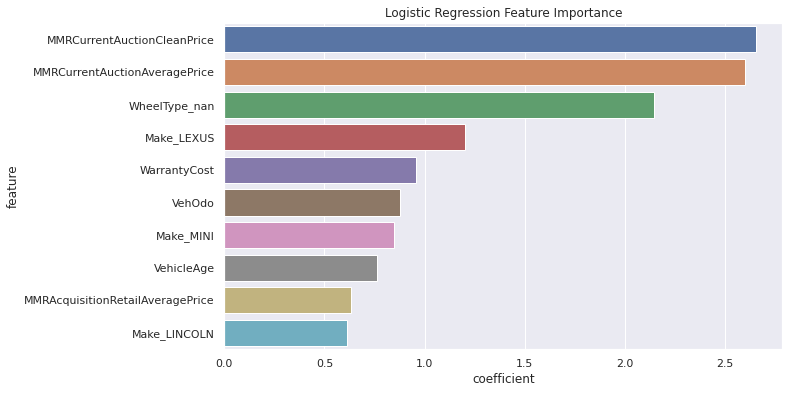

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

log_feature_importance_df = pd.DataFrame({
  'feature': X_train.columns,
  'coefficient': log_regression.coef_[0]
}).sort_values('coefficient', ascending=False)

plt.title('Logistic Regression Feature Importance')
sns.barplot(data=log_feature_importance_df.head(10), x='coefficient', y='feature');

In [94]:
train_pred = log_regression.predict(X_train)
val_pred = log_regression.predict(X_val)
test_pred = log_regression.predict(X_test)

In [95]:
from sklearn.metrics import accuracy_score
accuracy_score(train_output, train_pred)

0.8948137660142959

In [96]:
accuracy_score(val_output, val_pred)

0.8959375214085086

In [97]:
accuracy_score(test_output, test_pred)

0.8976502020963212

Decision Trees

In [98]:
from sklearn.tree import DecisionTreeClassifier

In [99]:
Decision_tree = DecisionTreeClassifier(random_state=42)

In [100]:
Decision_tree.fit(X_train, train_output)

DecisionTreeClassifier(random_state=42)

In [101]:
train_pred_2 = Decision_tree.predict(X_train)
val_pred_2 = Decision_tree.predict(X_val)
test_pred_2 = Decision_tree.predict(X_test)

In [102]:
accuracy_score(train_output, train_pred_2)

1.0

In [103]:
accuracy_score(val_output, val_pred_2)

0.8225662807426184

In [104]:
accuracy_score(test_output, test_pred_2)

0.8253065698431185

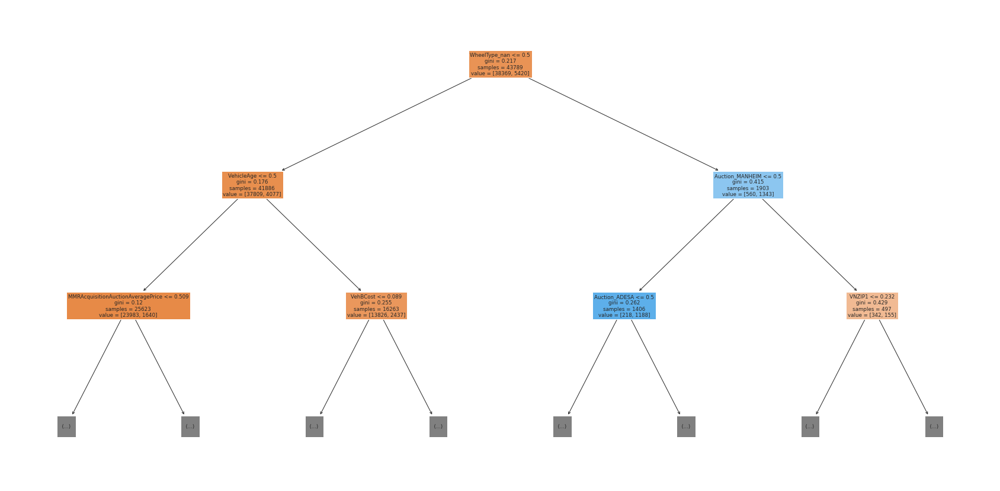

In [105]:
from sklearn.tree import plot_tree, export_text
plt.figure(figsize=(30,15))
plot_tree(Decision_tree, feature_names=X_train.columns, max_depth=2, filled=True);

In [106]:
tree_text = export_text(Decision_tree, max_depth=2, feature_names=list(X_train.columns))

In [107]:
print(tree_text[:2000])

|--- WheelType_nan <= 0.50
|   |--- VehicleAge <= 0.50
|   |   |--- MMRAcquisitionAuctionAveragePrice <= 0.51
|   |   |   |--- truncated branch of depth 37
|   |   |--- MMRAcquisitionAuctionAveragePrice >  0.51
|   |   |   |--- truncated branch of depth 2
|   |--- VehicleAge >  0.50
|   |   |--- VehBCost <= 0.09
|   |   |   |--- truncated branch of depth 30
|   |   |--- VehBCost >  0.09
|   |   |   |--- truncated branch of depth 37
|--- WheelType_nan >  0.50
|   |--- Auction_MANHEIM <= 0.50
|   |   |--- Auction_ADESA <= 0.50
|   |   |   |--- truncated branch of depth 15
|   |   |--- Auction_ADESA >  0.50
|   |   |   |--- truncated branch of depth 13
|   |--- Auction_MANHEIM >  0.50
|   |   |--- VNZIP1 <= 0.23
|   |   |   |--- truncated branch of depth 2
|   |   |--- VNZIP1 >  0.23
|   |   |   |--- truncated branch of depth 15



In [108]:
tree_importances = Decision_tree.feature_importances_

In [109]:
tree_importance_df = pd.DataFrame({
  'feature': X_train.columns,
  'importance': tree_importances
}).sort_values('importance', ascending=False)

In [110]:
tree_importance_df.head(10)

,feature,importance
79,WheelType_nan,0.141871
2,VehOdo,0.075271
12,VehBCost,0.066076
11,VNZIP1,0.055224
18,WeekOfYear,0.044174
3,MMRAcquisitionAuctionAveragePrice,0.043061
9,MMRCurrentRetailAveragePrice,0.042520
8,MMRCurrentAuctionCleanPrice,0.042134
17,Day,0.042088
14,WarrantyCost,0.039350


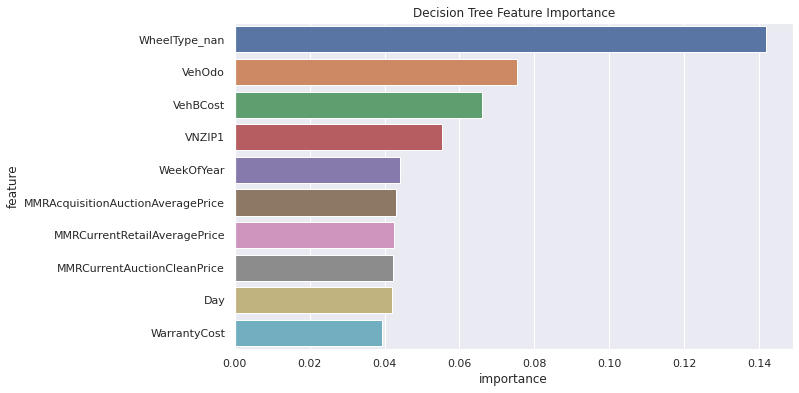

In [111]:
plt.title('Decision Tree Feature Importance')
sns.barplot(data=tree_importance_df.head(10), x='importance', y='feature');

In [112]:
tree2 = DecisionTreeClassifier(max_depth=6, random_state=42)

In [113]:
tree2.fit(X_train, train_output)

DecisionTreeClassifier(max_depth=6, random_state=42)

In [114]:
train_pred3 = tree2.predict(X_train)
val_pred3 = tree2.predict(X_val)
test_pred3 = tree2.predict(X_test)

In [115]:
accuracy_score(train_output, train_pred3)

0.9015962913060358

In [116]:
accuracy_score(val_output, val_pred3)

0.8997739261492087

In [117]:
accuracy_score(test_output, test_pred3)

0.9040213742549839

Random forests

In [119]:
from sklearn.ensemble import RandomForestClassifier

In [120]:
randomFClassifier = RandomForestClassifier(n_jobs=-1, random_state=42)

In [121]:
randomFClassifier.fit(X_train, train_output)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [122]:
train_pred4 = randomFClassifier.predict(X_train)
val_pred4 = randomFClassifier.predict(X_val)
test_pred4 = randomFClassifier.predict(X_test)

In [123]:
accuracy_score(train_output, train_pred4)

0.9999771632145059

In [124]:
accuracy_score(val_output, val_pred4)

0.8996369116941837

In [125]:
accuracy_score(test_output, test_pred4)

0.9029937658422964

In [127]:
rf_importance_df = pd.DataFrame({
  'feature': X_train.columns,
  'importance': randomFClassifier.feature_importances_
}).sort_values('importance', ascending=False)

In [128]:
rf_importance_df.head(10)

,feature,importance
79,WheelType_nan,0.096628
2,VehOdo,0.052929
12,VehBCost,0.052572
4,MMRAcquisitionAuctionCleanPrice,0.045686
7,MMRCurrentAuctionAveragePrice,0.045531
9,MMRCurrentRetailAveragePrice,0.045205
10,MMRCurrentRetailCleanPrice,0.044921
8,MMRCurrentAuctionCleanPrice,0.044717
3,MMRAcquisitionAuctionAveragePrice,0.044421
5,MMRAcquisitionRetailAveragePrice,0.043696


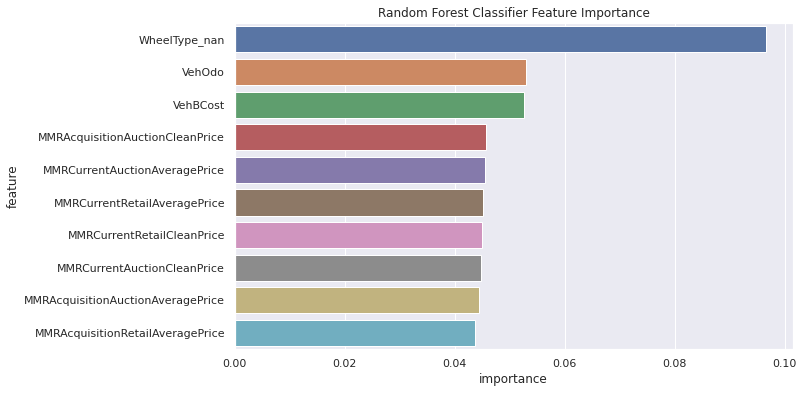

In [129]:
plt.title('Random Forest Classifier Feature Importance')
sns.barplot(data=rf_importance_df.head(10), x='importance', y='feature');

XGBoost

In [130]:
!pip3 install xgboost

     |████████████████████████████████| 192.9 MB 26 kB/s s eta 0:00:01/s eta 0:00:24


In [131]:
from xgboost import XGBClassifier

In [132]:
XGBCLASSIFIER=XGBClassifier(random_state=42,eval_metric='logloss', use_label_encoder=False)

In [133]:
XGBCLASSIFIER.fit(X_train,train_output)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=6,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, ...)

In [134]:
train_predict= XGBCLASSIFIER.predict(X_train)

In [135]:
train_predict

array([0, 0, 0, ..., 0, 0, 0])

In [136]:
train_pred5 = XGBCLASSIFIER.predict(X_train)
val_pred5 = XGBCLASSIFIER.predict(X_val)
test_pred5 = XGBCLASSIFIER.predict(X_test)

In [137]:
accuracy_score(train_output, train_pred5)

0.9240448514467103

In [138]:
importance_df = pd.DataFrame({'feature':X_train.columns,
                            'importance': XGBCLASSIFIER.feature_importances_}).sort_values('importance', ascending=False)
importance_df.head(10)

,feature,importance
79,WheelType_nan,0.337824
1,VehicleAge,0.045856
20,Auction_MANHEIM,0.040128
106,AUCGUART_GREEN,0.023270
103,PRIMEUNIT_NO,0.020214
15,Year,0.013712
105,PRIMEUNIT_nan,0.012146
19,Auction_ADESA,0.011595
87,Size_LARGE,0.011324
77,WheelType_Covers,0.010644


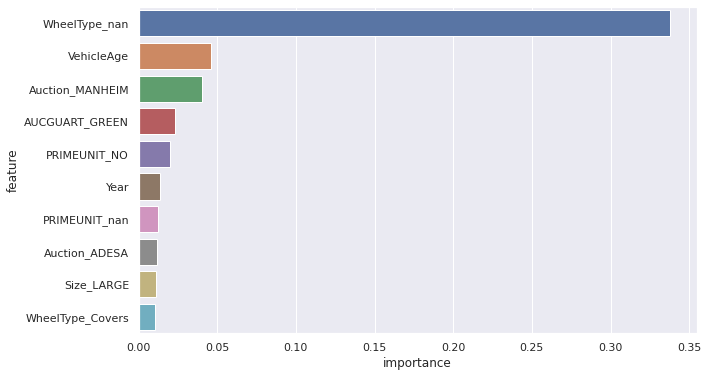

In [139]:
sns.barplot(data=importance_df.head(10), y='feature', x='importance');

K-Nearest neighbour

Hyperparameter Tuning

In [140]:
?DecisionTreeClassifier

In [141]:
from sklearn.metrics import mean_squared_error

In [142]:
def test_params(**params):
    model = DecisionTreeClassifier(random_state=42, **params).fit(X_train, train_output)
    return model.score(X_train, train_output), model.score(X_test, test_output)
    print('Train')

In [143]:
test_params(max_features=15)

(1.0, 0.825375077070631)

In [144]:
test_params(max_features=10)

(1.0, 0.8222922518325684)

In [145]:
test_params(max_features=30)

(1.0, 0.8312666986367062)

In [146]:
test_params(max_features=50)

(1.0, 0.8257176132081935)

In [147]:
test_params(max_features=100)

(1.0, 0.825238062615606)

In [148]:
test_params(max_features=200)

(1.0, 0.8253065698431185)

In [149]:
test_params(max_depth=5)

(0.9005686359588024, 0.9029252586147839)

In [150]:
test_params(max_depth=6)

(0.9015962913060358, 0.9040213742549839)

In [151]:
test_params(max_depth=10)

(0.9105254744342186, 0.8988148249640338)

In [152]:
test_params(max_depth=30)

(0.9954098061156912, 0.8291429745838186)

In [153]:
test_params(max_depth=40)

(1.0, 0.8253065698431185)

In [154]:
test_params(max_depth=50)

(1.0, 0.8253065698431185)

In [155]:
test_params(max_leaf_nodes = 2)

(0.8941058256639796, 0.8975816948688087)

In [156]:
test_params(max_leaf_nodes = 5)

(0.8983763045513713, 0.9014866068370213)

In [157]:
test_params(max_leaf_nodes = 10)

(0.8991755920436639, 0.9017606357470713)

In [158]:
test_params(max_leaf_nodes = 20)

(0.9007970038137432, 0.9034733164348839)

In [159]:
test_params(max_leaf_nodes = 30)

(0.9020987005869053, 0.9045694320750839)

In [160]:
test_params(max_leaf_nodes = 32)

(0.9020987005869053, 0.9045694320750839)

In [161]:
test_params(max_leaf_nodes = 40)

(0.9025097627257987, 0.9038158525724463)

In [162]:
test_params(min_samples_split = 10)

(0.9587110918267144, 0.8430499417688566)

In [163]:
test_params(min_samples_split = 20)

(0.9375870652446961, 0.8620264437898199)

In [164]:
test_params(min_samples_split = 30)

(0.9288177396149718, 0.8707953689114202)

In [165]:
test_params(min_samples_split = 40)

(0.9234739318093586, 0.8764129615674454)

In [166]:
test_params(min_samples_split = 50)

(0.9195003311333897, 0.8812084674933205)

In [167]:
test_params(min_samples_split = 70)

(0.913745461188883, 0.8855244228266083)

In [168]:
test_params(min_samples_split = 100)

(0.9100915755098312, 0.8913475371651709)

In [169]:
test_params(min_samples_split = 200)

(0.9040398273539016, 0.8963485647735836)

In [170]:
test_params(min_samples_split = 400)

(0.9014821073785654, 0.8992943755566212)

In [171]:
test_params(min_samples_split = 500)

(0.9005001256023202, 0.8992258683291087)

In [172]:
test_params(min_samples_leaf = 10)

(0.9150243211765512, 0.8778516133452079)

In [173]:
test_params(min_samples_leaf = 20)

(0.9050218091301468, 0.893676782900596)

In [174]:
test_params(min_samples_leaf = 30)

(0.9023727420128342, 0.9010070562444338)

In [175]:
test_params(min_samples_leaf = 50)

(0.8997236748955217, 0.9012125779269713)

In [176]:
test_params(min_samples_leaf = 80)

(0.8990842449016876, 0.9021716791121464)

Step 6 Training the best model

In [177]:
model = DecisionTreeClassifier( 
                               random_state=42,
                               max_features = 30,
                               max_leaf_nodes = 32,
                               min_samples_split = 500,
                               min_samples_leaf = 80,
                               max_depth=6)

In [178]:
# Train the model
model.fit(X_train, train_output)

DecisionTreeClassifier(max_depth=6, max_features=30, max_leaf_nodes=32,
                       min_samples_leaf=80, min_samples_split=500,
                       random_state=42)

In [179]:
model.score(X_train, train_output), model.score(X_val, val_output)

(0.8897668364201055, 0.8896348564773584)

In [180]:
model.score(X_test, test_output)

0.8943618551757211

In [181]:
model = DecisionTreeClassifier( 
                               random_state=42,
                               max_depth=6)

In [182]:
# Train the model
model.fit(X_train, train_output)

DecisionTreeClassifier(max_depth=6, random_state=42)

In [183]:
model.score(X_train, train_output), model.score(X_val, val_output)

(0.9015962913060358, 0.8997739261492087)

In [184]:
model.score(X_test, test_output)

0.9040213742549839